In [1]:
import os
import cv2
import json
import time
import random

import pyexr
import numpy as np
import pandas as pd
import scipy.ndimage
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.model_selection import train_test_split

import torch
from torch.utils.data import Dataset, DataLoader

import binvox_rw
from models import *

In [2]:
device = torch.device('cuda:1')

epochs = 500
batch_size = 32
input_shape = (137, 137)

# Load data

In [3]:
sterio_imgs = [f'{folder}/{fn}' for folder in os.listdir('../../datasets/SterioShapeNet/') 
               for fn in os.listdir(f'../../datasets/SterioShapeNet/{folder}')]
models = [f'{folder}/{fn}' for folder in os.listdir('../../datasets/ShapeNetCore.v2/') if '.' not in folder 
          for fn in os.listdir(f'../../datasets/ShapeNetCore.v2/{folder}') ]
train, val = train_test_split([fp for fp in sterio_imgs if fp in models], test_size=0.05)

dataset = {'train': train, 'val': val}
len(train), len(val)

(31671, 1667)

In [4]:
dataset_path = '../../datasets'

while True:
    sample = random.choice(dataset['train'])
    
    fns = os.listdir(f'{dataset_path}/SterioShapeNet/{sample}') 
    with open(f'{dataset_path}/SterioShapeNet/{sample}/rotation_euler.json', 'r') as file:
        data = json.load(file)
    idx = random.choice([fn for fn in fns if '_l.png' in fn])[-8:-6]
    rotate_model = data[int(idx)]
    fns = sorted([fn for fn in fns if idx in fn])
    if len(fns) == 6:
        break

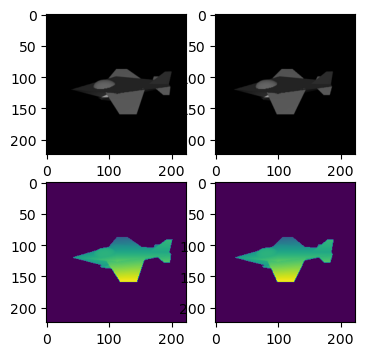

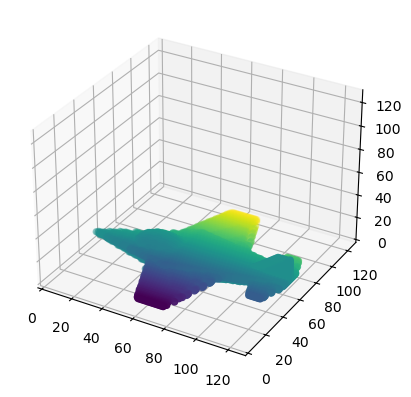

In [5]:
l = cv2.imread(f'{dataset_path}/SterioShapeNet/{sample}/{fns[4]}')
r = cv2.imread(f'{dataset_path}/SterioShapeNet/{sample}/{fns[5]}')

disp_l = pyexr.open(f'{dataset_path}/SterioShapeNet/{sample}/{fns[2]}').get("Disparity.Z").astype(np.float32)
disp_r = pyexr.open(f'{dataset_path}/SterioShapeNet/{sample}/{fns[3]}').get("Disparity.Z").astype(np.float32)

with open(f'{dataset_path}/ShapeNetCore.v2/{sample}/models/model_normalized.solid.binvox', 'rb') as f:
  vox = binvox_rw.read_as_3d_array(f)
vox.data = np.transpose(vox.data, (2, 0, 1))

fig, axes = plt.subplots(figsize=(4, 4), ncols=2, nrows=2)
axes[0, 0].imshow(l)
axes[0, 1].imshow(r)
axes[1, 0].imshow(disp_l)
axes[1, 1].imshow(disp_r)
plt.show()

threshold = 0.5
x, y, z = np.where(vox.data > threshold)
ax = plt.figure().add_subplot(projection='3d')
ax.scatter(x, y, z, c=y, cmap='viridis', marker='o')
ax.set_xlim([0, 128])
ax.set_ylim([0, 128])
ax.set_zlim([0, 128])
plt.show()

In [6]:
class SterioDataset(Dataset):
    def __init__(self, dataset_path, subset, output_shape, batch_size, num_steps):
        super(Dataset, self).__init__()
        
        self.dataset_path = dataset_path    
        self.subset = subset
        
        self.batch_size = batch_size
        self.num_steps = num_steps
        self.output_shape = output_shape

    def preprocess_image(self, image):
        img_resized = cv2.resize(image, (self.output_shape[0], self.output_shape[1]), interpolation=cv2.INTER_LINEAR)
        
        img_array = img_resized / (img_resized.max() + 1e-10)

        if len(img_array.shape) == 2:
            img_array = np.expand_dims(img_array, axis=-1)
        
        mean = img_array.mean()
        std = img_array.std() + 1e-8  
        img_array = (img_array - mean) / std
        
        img_tensor = torch.tensor(img_array, dtype=torch.float32)
        img_tensor = img_tensor.permute(2, 0, 1)
        return img_tensor
        
    def __len__(self):
        return self.batch_size * self.num_steps

    def __getitem__(self, idx):
        while True:
            try:
                sample = random.choice(self.subset)
                fns = os.listdir(f'{self.dataset_path}/SterioShapeNet/{sample}') 
                idx = random.choice([fn for fn in fns if '_l.png' in fn])[-8:-6]
                fns = sorted([fn for fn in fns if idx in fn])
                if len(fns) == 6 and os.path.exists(f'{self.dataset_path}/ShapeNetCore.v2/{sample}/models/model_normalized.solid.binvox'):
                    break
            except Exception:
                pass

        l = cv2.imread(f'{self.dataset_path}/SterioShapeNet/{sample}/{fns[4]}')
        r = cv2.imread(f'{self.dataset_path}/SterioShapeNet/{sample}/{fns[5]}')
        
        disp_l = pyexr.open(f'{self.dataset_path}/SterioShapeNet/{sample}/{fns[2]}').get("Disparity.Z")
        disp_r = pyexr.open(f'{self.dataset_path}/SterioShapeNet/{sample}/{fns[3]}').get("Disparity.Z")
        
        with open(f'{self.dataset_path}/ShapeNetCore.v2/{sample}/models/model_normalized.solid.binvox', 'rb') as f:
            vox = binvox_rw.read_as_3d_array(f)
            vox.data = np.transpose(vox.data, (2, 0, 1))
            reshaped = vox.data.reshape(32, 4, 32, 4, 32, 4)
            block_average = torch.tensor(reshaped.max(axis=(1, 3, 5))).to(torch.float32)
            
        l, r, disp_l, disp_r = [self.preprocess_image(e) for e in [l, r, disp_l, disp_r]]
            
        
        return l, r, disp_l, disp_r, block_average

In [7]:
train_dataset = SterioDataset(dataset_path, dataset['train'], input_shape, batch_size, 250)
val_dataset = SterioDataset(dataset_path, dataset['val'], input_shape, batch_size, 30)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=12)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=12)

# Train

In [8]:
models = {
  'disp': DispNetB(), # input: [(3, 137, 137), (3, 137, 137)]
  'enc': Encoder(), # input: (4, 137, 137)
  'cor': CorrNet(device), # input: [(256, 34, 34), (256, 34, 34)]
  'dec': Decoder() # input: [(128, 4, 4, 4), (128, 4, 4, 4), (64, 4, 4, 4)]
}

optimizers = [torch.optim.NAdam(models[name].parameters(), lr=1e-4) for name in models.keys()]
schedulers = [torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=5) for optimizer in optimizers]

for name in models.keys():
  models[name] = models[name].to(device)

In [8]:
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()

best_iou = 0
best_epoch = 0
thresh = 0.5
for epoch in range(epochs):
    epoch_time = time.time()
    
    _ = [models[name].train() for name in models.keys()]

    train_disp_losses = 0
    train_model_losses = 0
    for i, (l, r, disp_l, disp_r, model) in enumerate(train_loader):
        try:
            l, r, disp_l, disp_r, model = l.to(device), r.to(device), disp_l.to(device), disp_r.to(device), model.to(device)
        
            disp_l_, disp_r_ = models['disp'](l, r)
            
            l_ = torch.cat((l, disp_l_), dim=1)
            r_ = torch.cat((r, disp_r_), dim=1)
            
    
            l_, l_corr = models['enc'](l_)
            r_, r_corr = models['enc'](r_)
            
            corr_ = models['cor'](l_corr, r_corr)
            
            model_ = models['dec'](l_, r_, corr_)
    
            disp_loss = mse_loss(disp_l_, disp_l) + mse_loss(disp_r_, disp_r)
            model_loss = bce_loss(model_, model)

        except Exception:
            disp_loss = train_disp_losses / (i+1)
            model_loss = train_model_losses / (i+1)
            print('Error')
            
        _ = [models[name].zero_grad() for name in models.keys()]

        disp_loss.backward(retain_graph=True)
        model_loss.backward()

        _ = [optimizer.step() for optimizer in optimizers]   
        
        train_disp_losses += disp_loss
        train_model_losses += model_loss


        print('\rEpoch: {}, lr: {},  {}/{}, train_disp_loss: {:.4f}, train_model_loss: {:.4f}'.format(epoch, optimizers[0].param_groups[0]['lr'],
                                                                                                      i+1, len(train_loader),train_disp_losses/(i+1), 
                                                                                                      train_model_losses/(i+1)), 
              end='')

    val_disp_losses = 0
    val_model_losses = 0
    val_iou = 0
    for i, (l, r, disp_l, disp_r, model) in enumerate(val_loader):
        try:
            l, r, disp_l, disp_r, model = l.to(device), r.to(device), disp_l.to(device), disp_r.to(device), model.to(device)
        
            with torch.no_grad():
                disp_l_, disp_r_ = models['disp'](l, r)
            
                l_ = torch.cat((l, disp_l_), dim=1)
                r_ = torch.cat((r, disp_r_), dim=1)
                
        
                l_, l_corr = models['enc'](l_)
                r_, r_corr = models['enc'](r_)
                
                corr_ = models['cor'](l_corr, r_corr)
                
                model_ = models['dec'](l_, r_, corr_)
        
                disp_loss = mse_loss(disp_l_, disp_l) + mse_loss(disp_r_, disp_r)
                model_loss = bce_loss(model_, model)
        except Exception:
            disp_loss = val_disp_losses / (i+1)
            model_loss = val_model_losses / (i+1)
            print('Error')
        
        val_disp_losses += disp_loss
        val_model_losses += model_loss

        _volume = torch.ge(model_, thresh).to(torch.float32)
        intersection = torch.sum(_volume.mul(model)).to(torch.float32)
        union = torch.sum(torch.ge(_volume.add(model), 1)).to(torch.float32)
        val_iou += intersection / union

    print(' | val_disp_loss: {:.4f}, val_model_loss: {:.4f}, val_iou: {:.4f}'.format(val_disp_losses/(i+1), 
                                                                                            val_model_losses/(i+1),
                                                                                            val_iou/(i+1)), 
          end='')

    _ = [scheduler.step(val_iou/(i+1)) for scheduler in schedulers] 
    
    if best_iou < val_iou/(i+1):
        best_epoch = epoch
        best_iou = val_iou/(i+1)
        print(f'\nnew best iou {best_iou:.4f}', end='')
        _ = [torch.save(models[name].state_dict(), f'./{name}.pth') for name in models.keys()]

    print('\nepoch time: {:.2f}'.format(time.time() - epoch_time))

Epoch: 0, lr: 0.0001,  250/250, train_disp_loss: 1.0554, train_model_loss: 0.1397 | val_disp_loss: 0.8802, val_model_loss: 0.1014, val_iou: 0.3147
new best iou 0.3147
epoch time: 284.40
Epoch: 1, lr: 0.0001,  250/250, train_disp_loss: 0.7680, train_model_loss: 0.1017 | val_disp_loss: 0.8064, val_model_loss: 0.0869, val_iou: 0.4179
new best iou 0.4179
epoch time: 284.02
Epoch: 2, lr: 0.0001,  250/250, train_disp_loss: 0.6900, train_model_loss: 0.0907 | val_disp_loss: 0.6465, val_model_loss: 0.0864, val_iou: 0.4018
epoch time: 283.71
Epoch: 3, lr: 0.0001,  250/250, train_disp_loss: 0.6414, train_model_loss: 0.0850 | val_disp_loss: 0.6350, val_model_loss: 0.0779, val_iou: 0.4343
new best iou 0.4343
epoch time: 284.30
Epoch: 4, lr: 0.0001,  250/250, train_disp_loss: 0.6145, train_model_loss: 0.0840 | val_disp_loss: 0.5733, val_model_loss: 0.0792, val_iou: 0.4725
new best iou 0.4725
epoch time: 284.21
Epoch: 5, lr: 0.0001,  250/250, train_disp_loss: 0.5767, train_model_loss: 0.0801 | val_di

KeyboardInterrupt: 

# Test

In [16]:
_ = [models[name].load_state_dict(torch.load(f'./{name}.pth', weights_only=False)) for name in models.keys()]

In [17]:
l, r, disp_l, disp_r, model = next(iter(val_loader))
l, r, disp_l, disp_r, model = l.to(device), r.to(device), disp_l.to(device), disp_r.to(device), model.to(device)

with torch.no_grad():
    disp_l_, disp_r_ = models['disp'](l, r)
    
    l_ = torch.cat((l, disp_l_), dim=1)
    r_ = torch.cat((r, disp_r_), dim=1)
    
    
    l_, l_corr = models['enc'](l_)
    r_, r_corr = models['enc'](r_)
    
    corr_ = models['cor'](l_corr, r_corr)
    
    model_ = models['dec'](l_, r_, corr_)

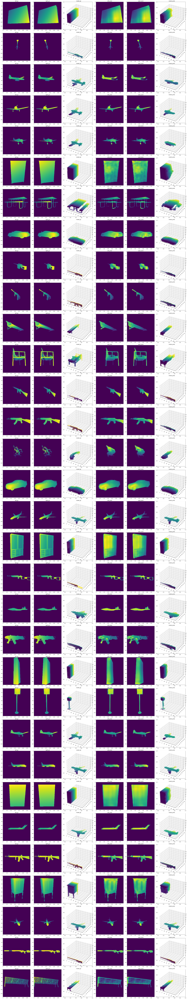

In [38]:
threshold = 0.3

fig, axes = plt.subplots(32, 6, figsize=(30, 160), subplot_kw={'projection': None})

for i in range(32):
    axes[i, 0].imshow(disp_l[i, 0].cpu().detach())
    axes[i, 1].imshow(disp_r[i, 0].cpu().detach())
    axes[i, 3].imshow(disp_l_[i, 0].cpu().detach())
    axes[i, 4].imshow(disp_r_[i, 0].cpu().detach())
    
    axes[i, 0].set_title('left_gt')
    axes[i, 1].set_title('right_gt')
    axes[i, 3].set_title('left_pred')
    axes[i, 4].set_title('right_pred')

for i in range(32):
    x, y, z = np.where(model[i].cpu().detach() > threshold)
    axes[i, 2] = fig.add_subplot(32, 6, i*6 + 3, projection='3d')
    axes[i, 2].scatter(x, y, z, c=y, cmap='viridis', marker='o')
    axes[i, 2].set_xlim([0, 32])
    axes[i, 2].set_ylim([0, 32])
    axes[i, 2].set_zlim([0, 32])
    axes[i, 2].set_title(f'model_gt')
    
    x, y, z = np.where(model_[i].cpu().detach() > threshold)
    axes[i, 5] = fig.add_subplot(32, 6, i*6 + 6, projection='3d')
    axes[i, 5].scatter(x, y, z, c=y, cmap='viridis', marker='o')
    axes[i, 5].set_xlim([0, 32])
    axes[i, 5].set_ylim([0, 32])
    axes[i, 5].set_zlim([0, 32])
    axes[i, 5].set_title(f'model_pred')
    
plt.tight_layout()
plt.show()